In [1]:
import sys
from pathlib import Path

PROJECT_ROOT = Path.cwd().resolve().parent   # goes from notebooks -> training_v2

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

print(PROJECT_ROOT)

/Users/karthikeyareddybyrapuram/ChalmersMasters/TRA455/finalpro/training_v2


In [2]:
import numpy as np
import torch
from model import DeepLagrangianNetwork_f1, DeepLagrangianNetwork_f2
from controller.GravityCompensation_DeLAN import GravityCompensationLNN
from controller.pd_gravcomp_lnn import PDGravCompLNN
from double_pendulum.simulation.simulation import Simulator
from double_pendulum.model.plant import DoublePendulumPlant
from double_pendulum.utils.plotting import plot_timeseries
%matplotlib inline
from IPython.display import HTML
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['animation.writer'] = "pillow"

In [3]:
from pathlib import Path

PROJECT_ROOT = Path.cwd().resolve().parent   # notebooks -> training_v2
CHECKPOINT_DIR = PROJECT_ROOT / "checkpoints"

print(CHECKPOINT_DIR)
print(CHECKPOINT_DIR.exists())

/Users/karthikeyareddybyrapuram/ChalmersMasters/TRA455/finalpro/training_v2/checkpoints
True


In [4]:
model = DeepLagrangianNetwork_f1(
    n_dof=2, learn_friction=True,
    n_width=64, n_depth=2, activation='Sine',
    diagonal_epsilon=1e-3, b_diag_init=0.5,
)


ck = torch.load(CHECKPOINT_DIR /'delan_best91_sine_f1_1.pt',
                map_location='cpu', weights_only=False)
model.load_state_dict(ck['model'])
model.eval()


DeepLagrangianNetwork(
  (layers): ModuleList(
    (0-1): 2 x LagrangianLayer(
      (g): Sin()
      (g_prime): SinDer()
    )
  )
  (net_g): LagrangianLayer(
    (g): Linear()
    (g_prime): LinearDer()
  )
  (net_lo): LagrangianLayer(
    (g): Linear()
    (g_prime): LinearDer()
  )
  (net_ld): LagrangianLayer(
    (g): ReLU()
    (g_prime): ReLUDer()
  )
)

In [5]:
x0=[2*np.pi/2.5, 0*np.pi/2.3, 0.0, 0.0]
ctrl = GravityCompensationLNN(model, torque_limit=[0.15, 0.15], scale=1)
ctrlpd = PDGravCompLNN(
    model,
    grav_scale=1,
    q_target=[x0[0], x0[1]],
    Kp=[0., 0.],
    Kd=[0.0, 0.0],
    torque_limit=[0.15, 0.15],
)

In [6]:
plant = DoublePendulumPlant(
    mass=[0.131, 0.064], length=[0.05, 0.05], com=[0.046, 0.048],
    gravity=9.81, inertia=[0.000277, 0.000147],
    damping=[0.000, 0.00102], torque_limit=[0.15, 0.15], coulomb_fric=[0.00168, 0.00088]
)
sim = Simulator(plant=plant)


In [7]:
import torch, numpy as np

m1, m2 = 0.131, 0.064
L1, L_com1, L_com2 = 0.05, 0.046, 0.048
g = 9.81

for q1, q2 in [(0., 0.), (np.pi/2, 0.), (np.pi/2, -np.pi/2), (0., np.pi/2), (np.pi/4, np.pi/4), (0., -np.pi/2),(1.27051961,-1.52746141)]:
    q = torch.tensor([[q1, q2]], dtype=torch.float32)
    qd = torch.zeros_like(q)
    with torch.no_grad():
        out = model._dyn_model(q, qd, torch.zeros_like(q))
    g_learned = out[3].squeeze().numpy()
    # hand calculations for gravity terms
    g_analytical_1 = (m1*L_com1 + m2*L1)*g*np.sin(q1) + m2*L_com2*g*np.sin(q1+q2)
    g_analytical_2 = m2*L_com2*g*np.sin(q1+q2)
    print(f'q=({q1:+.2f},{q2:+.2f})  predictied tau=({g_learned[0]:+.4f},{g_learned[1]:+.4f})N'
          f'  analytical~({g_analytical_1:+.4f},{g_analytical_2:+.4f})N')

q=(+0.00,+0.00)  predictied tau=(-0.0004,-0.0000)N  analytical~(+0.0000,+0.0000)N
q=(+1.57,+0.00)  predictied tau=(+0.1204,+0.0278)N  analytical~(+0.1206,+0.0301)N
q=(+1.57,-1.57)  predictied tau=(+0.0907,-0.0006)N  analytical~(+0.0905,+0.0000)N
q=(+0.00,+1.57)  predictied tau=(+0.0274,+0.0330)N  analytical~(+0.0301,+0.0301)N
q=(+0.79,+0.79)  predictied tau=(+0.0930,+0.0316)N  analytical~(+0.0941,+0.0301)N
q=(+0.00,-1.57)  predictied tau=(-0.0296,-0.0328)N  analytical~(-0.0301,-0.0301)N
q=(+1.27,-1.53)  predictied tau=(+0.0790,-0.0083)N  analytical~(+0.0788,-0.0077)N


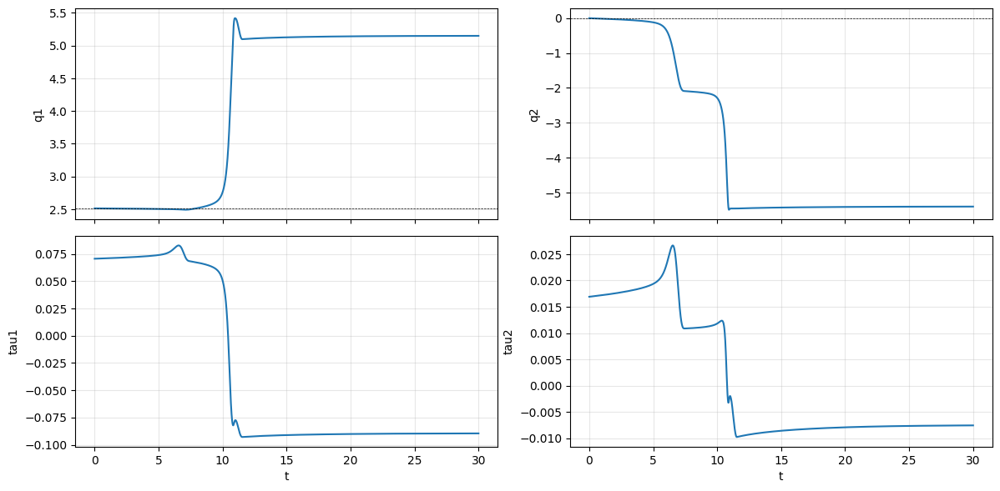

In [8]:
sim.reset()
mpl.rcParams['animation.embed_limit'] = 200
T, X, U, anim = sim.simulate_and_animate(
    t0=0.0,
    x0=x0,
    tf=30,
    dt=0.002,
    controller=ctrl,
    integrator="runge_kutta",
    plot_inittraj=False,
    anim_dt=0.1,
)
from IPython.display import HTML
html = HTML(anim.to_jshtml())
display(html)
plt.close()

T = np.asarray(T); X = np.asarray(X); U = np.asarray(U)
fig, axes = plt.subplots(2, 2, figsize=(12, 6), sharex=True)
axes[0,0].plot(T, X[:,0]); axes[0,0].set_ylabel('q1');  axes[0,0].axhline(x0[0], color='k', ls='--', lw=0.5)
axes[0,1].plot(T, X[:,1]); axes[0,1].set_ylabel('q2');  axes[0,1].axhline(x0[1], color='k', ls='--', lw=0.5)
axes[1,0].plot(T, U[:,0]); axes[1,0].set_ylabel('tau1'); axes[1,0].set_xlabel('t')
axes[1,1].plot(T, U[:,1]); axes[1,1].set_ylabel('tau2'); axes[1,1].set_xlabel('t')
for ax in axes.flat: ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

g_learned                       tau=[0.028, 0.0307]  q_final=(-0.023,+1.646)
plant.gravity_vector            tau=[0.0301, 0.0301]  q_final=(-0.000,+1.567)


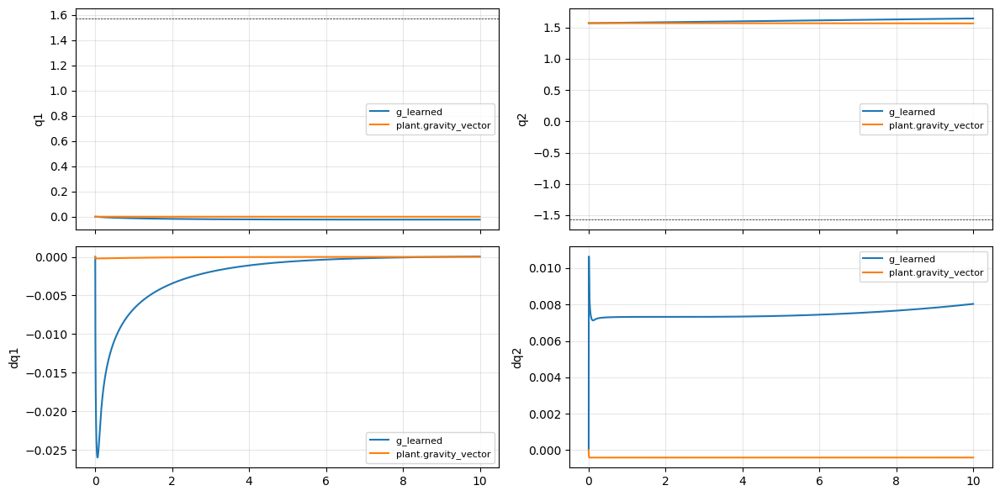

In [9]:
import numpy as np
import torch
from copy import deepcopy
from double_pendulum.controller.abstract_controller import AbstractController

# A controller that outputs a fixed torque, nothing else
class ConstantTorque(AbstractController):
    def __init__(self, tau): self.tau = list(tau)
    def init(self): pass
    def get_control_output(self, x, t=None): return self.tau

# Test 4 candidate torques at the same starting pose
x0 = np.array([0, np.pi/2, 0., 0.])
candidates = [
    ("g_learned ", [+0.0280,+0.0307]),
    ("plant.gravity_vector", [+0.0301,+0.0301]), 
]

import matplotlib.pyplot as plt
fig, axes = plt.subplots(2, 2, figsize=(12, 6), sharex=True)

for name, tau in candidates:
    sim_test = type(sim)(plant=deepcopy(sim.plant))   # fresh sim
    T, X, U = sim_test.simulate(
        t0=0.0, x0=x0.copy(), tf=10.0, dt=0.002,
        controller=ConstantTorque(tau),
        integrator='runge_kutta',
    )
    T, X = np.asarray(T), np.asarray(X)
    axes[0,0].plot(T, X[:,0], label=name)
    axes[0,1].plot(T, X[:,1], label=name)
    axes[1,0].plot(T, X[:,2], label=name)
    axes[1,1].plot(T, X[:,3], label=name)
    # also print the final position
    print(f'{name:30s}  tau={tau}  q_final=({X[-1,0]:+.3f},{X[-1,1]:+.3f})')


axes[0,0].axhline(np.pi/2, color='k', ls='--', lw=0.5)
axes[0,1].axhline(-np.pi/2, color='k', ls='--', lw=0.5)
for ax in axes.flat: ax.grid(True, alpha=0.3); ax.legend(fontsize=8)
axes[0,0].set_ylabel('q1'); axes[0,1].set_ylabel('q2')
axes[1,0].set_ylabel('dq1'); axes[1,1].set_ylabel('dq2')
plt.tight_layout(); plt.show()

In [11]:
from compare_gravity import compare_gravity
import torch
from model import DeepLagrangianNetwork_f1, DeepLagrangianNetwork_f2

def load_model_f1_sine(path):
    m = DeepLagrangianNetwork_f1(
        n_dof=2, learn_friction=True,
        n_width=64, n_depth=2, activation='Sine',
        diagonal_epsilon=1e-3, b_diag_init=0.5,
    )
    ck = torch.load(path, map_location='cpu', weights_only=False)
    m.load_state_dict(ck['model']); m.eval()
    return m

def load_model_f1_softplus(path):
    m = DeepLagrangianNetwork_f1(
        n_dof=2, learn_friction=True,
        n_width=64, n_depth=2, activation='SoftPlus',
        diagonal_epsilon=1e-3, b_diag_init=0.5,
    )
    ck = torch.load(path, map_location='cpu', weights_only=False)
    m.load_state_dict(ck['model']); m.eval()
    return m



models = {
    '16':    load_model_f1_sine(CHECKPOINT_DIR / 'delan_best16_sine_f1_1.pt'),
    '169':    load_model_f1_sine(CHECKPOINT_DIR / 'delan_best169_sine_f1_1.pt'),
    '171':    load_model_f1_sine(CHECKPOINT_DIR / 'delan_best171_sine_f1_1.pt'),
    '1stmodel': load_model_f1_softplus(CHECKPOINT_DIR / 'delan_best_1.pt'),
    '91_sine_f1_1_s5': load_model_f1_sine(CHECKPOINT_DIR / 'delan_best91_sine_f1_1_s5.pt'),
    '13rd_sine_f1_1': load_model_f1_sine(CHECKPOINT_DIR / 'delan_best13rd_sine_f1_1.pt'),
    '91_sine_f1_1': load_model_f1_sine(CHECKPOINT_DIR / 'delan_best91_sine_f1_1.pt'),
    '91_softplus_f1_1': load_model_f1_softplus(CHECKPOINT_DIR / 'delan_best91_softplus_f1_1.pt'),
    'overall': load_model_f1_softplus(CHECKPOINT_DIR / 'delan_best_4_strides2.pt')
}

results = compare_gravity(models)

      q = (q1, q2)  |             analytical |                     16 |                    169 |                    171 |               1stmodel |        91_sine_f1_1_s5 |         13rd_sine_f1_1 |           91_sine_f1_1 |       91_softplus_f1_1 |                overall
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
    (+0.00, +0.00)  |     (+0.0000, +0.0000) |     (-0.0011, +0.0003) |     (-0.0002, -0.0003) |     (-0.0025, -0.0015) |     (-0.0010, -0.0001) |     (-0.0012, -0.0002) |     (-0.0023, -0.0000) |     (-0.0004, -0.0000) |     (-0.0017, +0.0001) |     (-0.0008, -0.0001)
    (+1.57, +0.00)  |     (+0.1206, +0.0301) |     (+0.1193, +0.0272) |     (+0.1125, +0.0225) |     (+0.1192, +0.0276) |     (+0.1190, +0.0295) |     (+0.1189, +0.0272) |     (+0.1172, +0.0